In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud_2020 #pip install -U git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git
import pandas as pd
#All these packages need to be installed from pip
import scipy #For frequency analysis
import scipy.fftpack
import nltk #the Natural Language Toolkit
import requests #For downloading our datasets
import numpy as np #for arrays
import pandas #gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import seaborn #Makes the graphics look nicer
import IPython #To show stuff

#Image handling install as Pillow
import PIL
import PIL.ImageOps

#install as scikit-image, this does the image manupulation

from skimage import data, segmentation
from skimage.future import graph
import skimage
import skimage.feature
import skimage.segmentation
import skimage.filters
import skimage.color
import skimage.graph
import skimage.future.graph

#these three do audio handling
import pydub #Requires ffmpeg to be installed https://www.ffmpeg.org/download.html; on a mac "brew install ffmpeg"
import speech_recognition #install as speechrecognition
import soundfile #Install as pysoundfile 

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning it may generate.
%matplotlib inline

import os
import os.path
import csv
import re

from os import listdir
from os.path import isfile, join

from jiwer import wer


from imageai.Detection import ObjectDetection
import os

Using TensorFlow backend.


In [2]:
import tensorflow
tensorflow.__version__

'1.15.2'

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [4]:
#Functions that are necessary 
# We are using a different package to convert than the in the rest of the code
def convertToWAV(sourceFile, outputFile, overwrite = False):
    if os.path.isfile(outputFile) and not overwrite:
        print("{} exists already".format(outputFile))
        return
    #Naive format extraction
    sourceFormat = sourceFile.split('.')[-1]
    sound = pydub.AudioSegment.from_file(sourceFile, format=sourceFormat)
    sound.export(outputFile, format="wav")
    print("{} created".format(outputFile))
    
def loadTranscript(targetFile):
    #Regex because the transcripts aren't consistent enough to use csv
    regex = re.compile(r"(\d+\.\d+)\s(\d+\.\d+)\s(.+:)?\s+(.*)")
    dfDict = {
        'time_start' : [],
        'time_end' : [],
        'speaker' : [],
        'text' : [],
    }
    with open(targetFile, encoding='latin-1') as f:
        for line in f:
            r = re.match(regex, line)
            dfDict['time_start'].append(float(r.group(1)))
            dfDict['time_end'].append(float(r.group(2)))
            if r.group(3) is None:
                dfDict['speaker'].append(dfDict['speaker'][-1])
            else:
                dfDict['speaker'].append(r.group(3))
            dfDict['text'].append(r.group(4))
    return pandas.DataFrame(dfDict)

def maxfreq(sample, topN = 10):
    sampleFFT = scipy.fftpack.ifft(sample)
    N = len(sample)
    freqs = scipy.fftpack.fftfreq(N, d = 1 / soundSampleRate)
    tops =  np.argpartition(abs(sampleFFT[:, 0]), -topN)[-topN:]

    return np.mean(tops)


#Using another library so we need to use files again
def speechRec(targetFile, language = "en-US", raw = False, jsonFile = ''):
    r = speech_recognition.Recognizer()
    if not os.path.isfile(jsonFile):
        jsonString = None
    else:
        with open(jsonFile) as f:
            jsonString = f.read()
    with speech_recognition.AudioFile(targetFile) as source:
        audio = r.record(source)
    try:
        if jsonString is None:
            print("Sending data to Google Speech Recognition")
            dat =  r.recognize_google(audio)
        else:
            print("Sending data to Google Cloud Speech")
            dat =  r.recognize_google_cloud(audio, credentials_json=jsonString)
    except speech_recognition.UnknownValueError:
        print("Google could not understand audio")
    except speech_recognition.RequestError as e:
        print("Could not request results from Google service; {0}".format(e))
    else:
        print("Success")
        return dat

    
    
def normalizeConvo(a_c):
    s = np.sum(a_c.flatten())
    return a_c / s

def displayConvolution(img, convArray, threshold = None):
    img_array = np.asarray(img).astype('uint8')
    
    if len(img_array.shape) > 2:
        conv = np.zeros(img_array.shape)
        for i in range(img_array.shape[2]):
            conv[:,:,i] = scipy.ndimage.convolve(img_array[:,:,i], normalizeConvo(convArray), mode='constant')
    else:
        conv = scipy.ndimage.convolve(img_array, normalizeConvo(convArray), mode='constant')
    conv = conv.astype('uint8')
    if threshold is not None:
        if threshold < 1:
            threshold = threshold * 255
        conv[conv < threshold] = 0
    
    conv_image = PIL.Image.fromarray(conv)
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (17, 10))
    #This is to deal with some annoying plt/PIL stuff
    if len(img_array.shape) > 2:
        ax1.imshow(img)
    else:
        ax1.imshow(img_array)
    ax1.axis('off')
    ax1.set_title("Original")
    #return conv_image
    if len(img_array.shape) > 2:
        ax2.imshow(conv_image)
    else:
        ax2.imshow(np.asarray(conv_image))
    ax2.axis('off')
    ax2.set_title("Convolution")
    
    diff = PIL.ImageChops.difference(conv_image, img)
    if len(img_array.shape) > 2:
        ax3.imshow(diff)
    else:
        ax3.imshow(np.asarray(diff))
    ax3.axis('off')
    ax3.set_title("Difference")
    plt.tight_layout()
    plt.show()
    #Not returning anything to make displaying nicer

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Construct cells immediately below this that read in 10 audio files (e.g., produced on your smartphone recorder?) from at least two different speakers, which include sentences of different types (e.g., question, statement, exclamation). At least two of these should include recordings of the two speakers talking to each other (e.g., a simple question/answer). Contrast the frequency distributions of the words spoken within speaker. What speaker's voice has a higher and which has lower frequency? What words are spoken at the highest and lowest frequencies? What parts-of-speech tend to be high or low? How do different types of sentences vary in their frequency differently? When people are speaking to each other, how do their frequencies change? Whose changes more?

For the first part, i will use other examples from the Santa Barba corpus. Below, the necessary code for dealing with 10 samples is found

In [5]:
#The next function reads every mp3 list and transcription
audio_path = "/Users/csolisu/Downloads/audio samples for hw/audio"
trn_path = "/Users/csolisu/Downloads/audio samples for hw/transcriptions"
wav_path = "/Users/csolisu/Downloads/audio samples for hw/wav"
audiofiles = [f for f in listdir(audio_path) if isfile(join(audio_path, f))]
trnfiles = [f for f in listdir(trn_path) if isfile(join(trn_path, f))]



In [6]:
print("audiofiles:",audiofiles, "transcript files:", trnfiles)

audiofiles: ['SBC014.mp3', 'SBC015.mp3', 'SBC017.mp3', 'SBC002.mp3', 'SBC006.mp3', 'SBC007.mp3', 'SBC011.mp3', 'SBC005.mp3', 'SBC009.mp3', 'SBC045.mp3'] transcript files: ['SBC009.trn', 'SBC045.trn', 'SBC015.trn', 'SBC014.trn', 'SBC002.trn', 'SBC017.trn', 'SBC007.trn', 'SBC006.trn', 'SBC005.trn', 'SBC011.trn']


In [7]:
name_lst = []
for file in audiofiles:
    name = re.sub('.mp3', '', file)
    name_lst.append(name)
    

In [8]:
#Creating the 10 wav files that were selected from the Santa Barbara Corpus
for i in range(len(audiofiles)):
    convertToWAV(audio_path + "/" + audiofiles[i], wav_path + "/" + name_lst[i] + ".wav")

/Users/csolisu/Downloads/audio samples for hw/wav/SBC014.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC015.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC017.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC002.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC006.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC007.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC011.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC005.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC009.wav exists already
/Users/csolisu/Downloads/audio samples for hw/wav/SBC045.wav exists already


In [49]:
#Analyzing one of the 10 files, which will ilustrate the learnings for this exercise.
soundArr, soundSampleRate = soundfile.read(wav_path + "/" + "SBC014.wav")
soundArr.shape

(74847744, 2)

In [10]:
soundSampleRate

44100

In [11]:
numS = soundArr.shape[0] // soundSampleRate
print("The sample is {} seconds long".format(numS))
print("Or {:.2f} minutes".format(numS / 60))

The sample is 1697 seconds long
Or 28.28 minutes


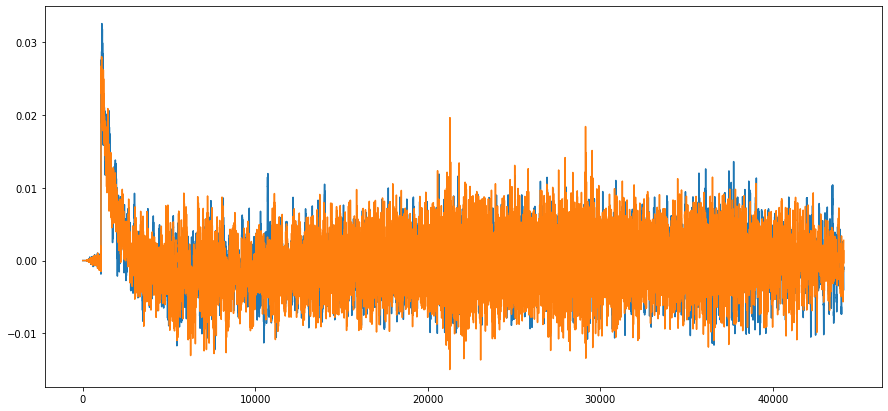

In [12]:
#First second of the recording
fig, ax = plt.subplots(figsize = (15, 7))
ax.plot(soundArr[:soundSampleRate])
plt.show()

In [13]:
soundArr.shape

(74847744, 2)

We also take a look at the first 10 seconds, which makes us realize that the first second is actually very quiet

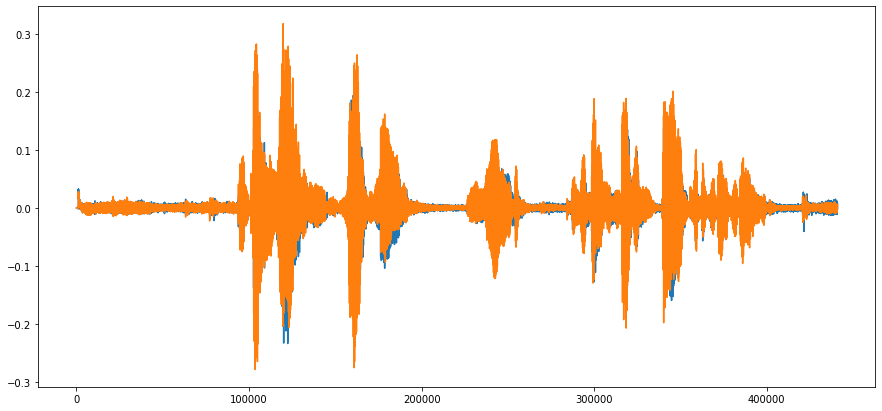

In [14]:
fig, ax = plt.subplots(figsize = (15, 7))
ax.plot(soundArr[:soundSampleRate * 10])
plt.show()

Loading the transcript

In [15]:
transcriptDF = loadTranscript(trn_path + "/" + "SBC014.trn")
transcriptDF[:100]

,time_start,time_end,speaker,text
0,0.00,2.53,FRED:,... Okay.
1,2.53,4.73,FRED:,"One= large loan (Hx),"
2,4.73,6.23,FRED:,"... renewed (Hx),"
3,6.23,8.08,FRED:,"... a hundred ninety-seven= .. thousand,"
4,8.08,9.23,FRED:,a hundred eighty dollars.
5,9.23,12.36,FRED:,... It's on ~Gerald and ~Pamela.
6,12.36,15.46,JIM:,... O[kay].
7,14.99,15.65,FRED:,"[They've pai]d,"
8,15.65,16.61,FRED:,"they've reduced,"
9,16.61,17.74,FRED:,... no problem.


These are all the people in the conversation, let's look at each of the frequencies they emit

In [16]:
transcriptDF.speaker.unique()

array(['FRED:', 'JIM:', 'JOE:', 'KURT:', 'X:', '>ENV:', 'VIVIAN:'],
      dtype=object)

In [17]:
#Need to be ints for indexing, luckily being off by a couple indices doesn't matter
transcriptDF['index_start'] = (transcriptDF['time_start'] * soundSampleRate).astype('int')
transcriptDF['index_end'] = (transcriptDF['time_end'] * soundSampleRate).astype('int')

Let's take a look at how "So you said they're gonna be .. fifteen??", said by FRED, looks like

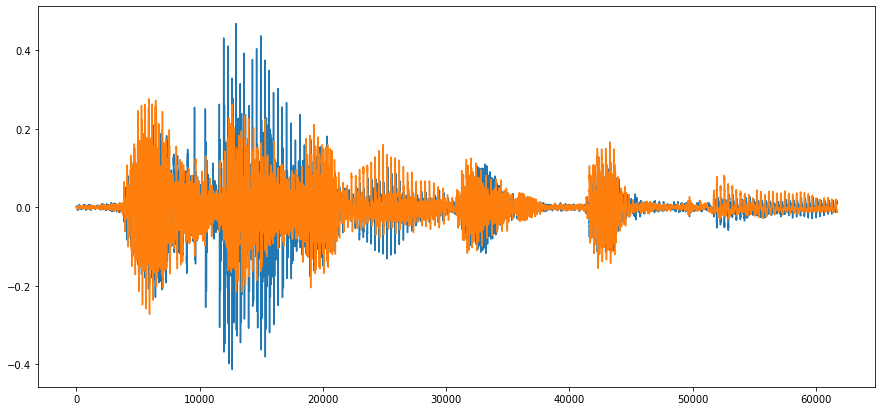

In [18]:
fig, ax = plt.subplots(figsize = (15, 7))
subSample1 = soundArr[transcriptDF['index_start'][99]: transcriptDF['index_end'][99]]
ax.plot(subSample1)
plt.show()

In [19]:
soundfile.write("/Users/csolisu/Downloads/audio samples for hw/samples" + "/sample1.wav", subSample1, soundSampleRate)
IPython.display.Audio("/Users/csolisu/Downloads/audio samples for hw/samples" + "/sample1.wav")

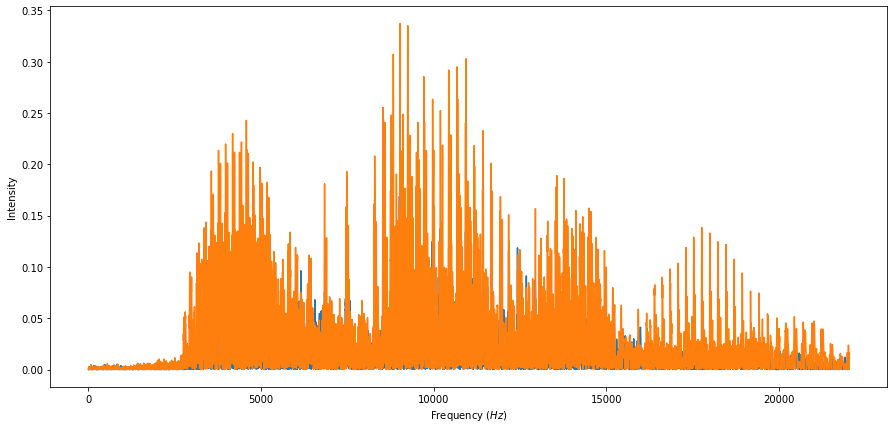

In [20]:
sample1FFT = scipy.fftpack.ifft(subSample1)
N = len(sample1FFT)
freq = scipy.fftpack.fftfreq(N, d = 1 / soundSampleRate)
fig, ax = plt.subplots(figsize = (15, 7))
ax.set_xlabel('Frequency ($Hz$)')
ax.set_ylabel('Intensity')
ax.plot(freq[:N//2], abs(sample1FFT)[:N//2]) #Only want positive frequencies
plt.show()

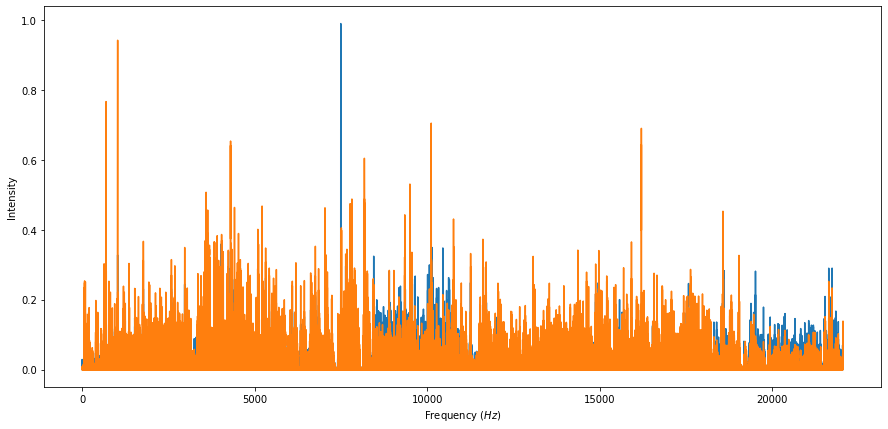

In [21]:
#This takes a while
fig, ax = plt.subplots(figsize = (15, 7))
fullFFT = scipy.fftpack.ifft(soundArr)
N = len(fullFFT)
freq = scipy.fftpack.fftfreq(N, d = 1 / soundSampleRate)
ax.plot(freq[:N//2], abs(fullFFT)[:N//2]) #Only want positive frequencies
ax.set_xlabel('Frequency ($Hz$)')
ax.set_ylabel('Intensity')
plt.show()

In [22]:
freq[len(freq) // 2 -10: len(freq) // 2 + 5]

array([ 22049.99410804,  22049.99469723,  22049.99528643,  22049.99587563,
        22049.99646482,  22049.99705402,  22049.99764322,  22049.99823241,
        22049.99882161,  22049.9994108 , -22050.        , -22049.9994108 ,
       -22049.99882161, -22049.99823241, -22049.99764322])

In [23]:
freqs = []
for i, row in transcriptDF.iterrows():
    freqs.append(maxfreq(soundArr[row['index_start']: row['index_end']]))

transcriptDF['frequency FFT'] = freqs

Below, we will take a look at how each of the speakers' sound look like. We see that Fred speaks along the whole conversation, Jim's intervention intensifies after the first third of the conversation, Joe speaks much more at the beginning that at the end, and that Vivian almost don't speak

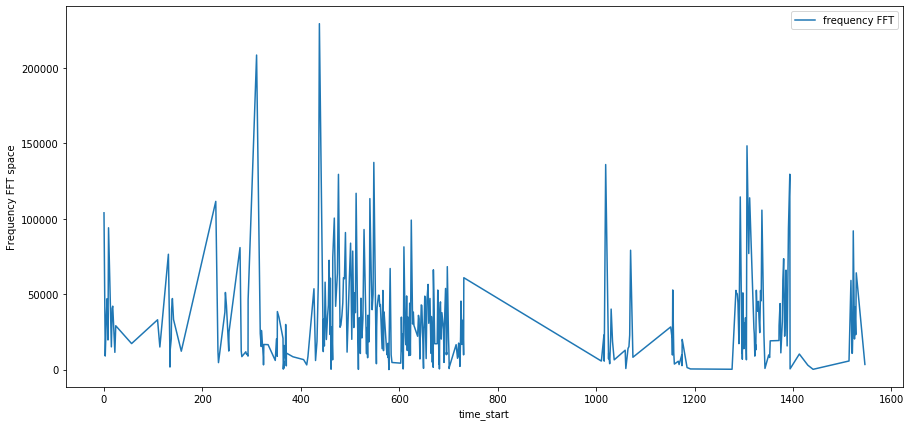

In [24]:
fig, ax = plt.subplots(figsize = (15, 7))
transcriptDF[transcriptDF['speaker'] == 'FRED:'].plot( 'time_start', 'frequency FFT', ax = ax)
ax.set_ylabel("Frequency FFT space")
plt.show()

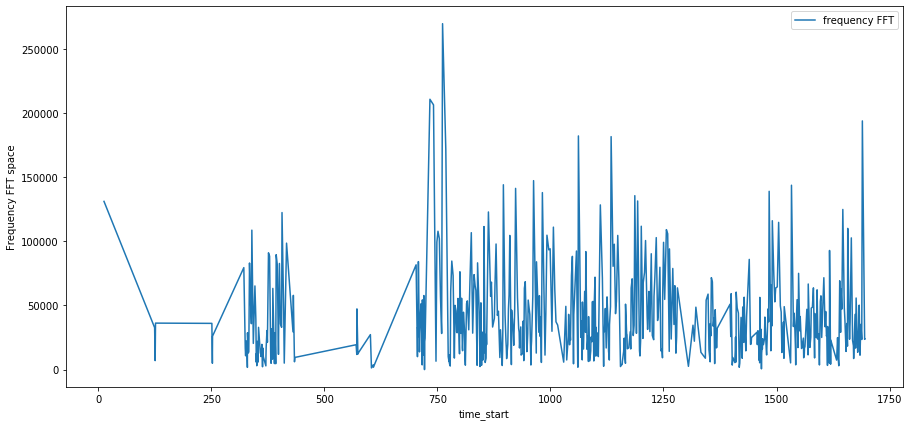

In [25]:
fig, ax = plt.subplots(figsize = (15, 7))
transcriptDF[transcriptDF['speaker'] == 'JIM:'].plot( 'time_start', 'frequency FFT', ax = ax)
ax.set_ylabel("Frequency FFT space")
plt.show()

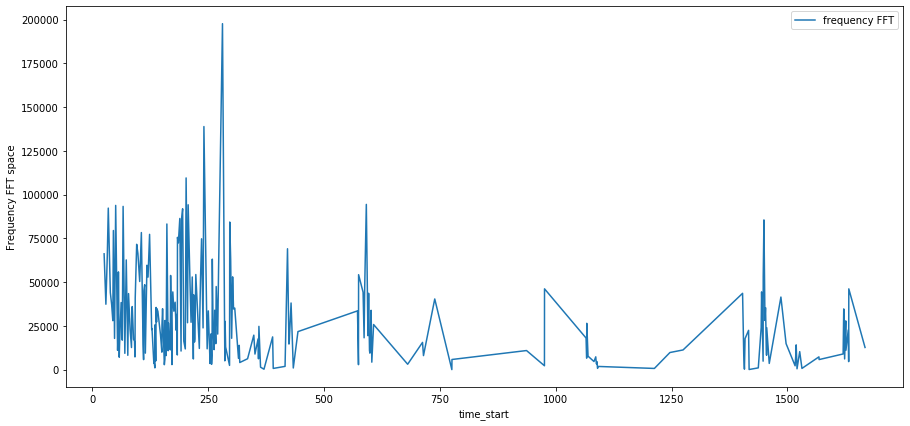

In [26]:
fig, ax = plt.subplots(figsize = (15, 7))
transcriptDF[transcriptDF['speaker'] == 'JOE:'].plot( 'time_start', 'frequency FFT', ax = ax)
ax.set_ylabel("Frequency FFT space")
plt.show()

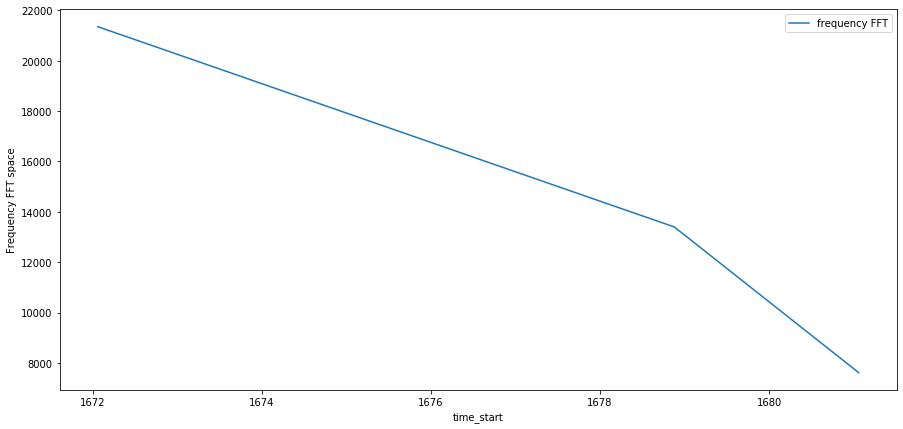

In [27]:
fig, ax = plt.subplots(figsize = (15, 7))
transcriptDF[transcriptDF['speaker'] == 'VIVIAN:'].plot( 'time_start', 'frequency FFT', ax = ax)
ax.set_ylabel("Frequency FFT space")
plt.show()

The highest frequencies must be from Jim, and the lowest, from Kurt.

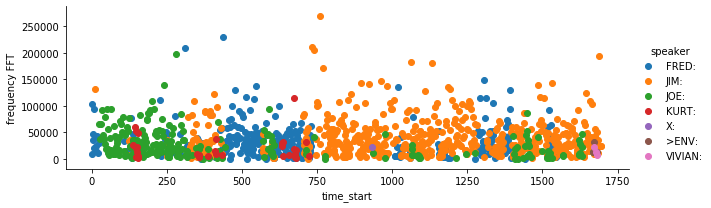

In [28]:
fg = seaborn.FacetGrid(data=transcriptDF, hue='speaker', aspect = 3)
fg.map(plt.scatter, 'time_start', 'frequency FFT').add_legend()

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">Construct cells immediately below this that use the 10 audio files from at least two different speakers read in previously, attempt to automatically extract the words from Google, and calculate the word-error rate, as descibed in Chapter 9 from *Jurafsky & Martin*, page 334. How well does it do? Under what circumstances does it perform poorly? 

For this example i take some of the jokes that can be found at http://www.manythings.org/jokes/

In [79]:
joke_path = "/Users/csolisu/Downloads/audio samples for hw/audio_examples"
joke_files = [f for f in listdir(joke_path) if isfile(join(joke_path, f))]

In [84]:
joke_lst = []
for file in joke_files:
    name = re.sub('.mp3', '', file)
    joke_lst.append(name)

In [85]:
#Creating the 10 wav files that were selected from the Santa Barbara Corpus
for i in range(len(joke_files)):
    convertToWAV(joke_path + "/" + joke_files[i], joke_path + "/" + joke_lst[i] + ".wav")

/Users/csolisu/Downloads/audio samples for hw/audio_examples/bill.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/alphabet_riddles.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/taxi_joke.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/a_cute_dog.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/restaurant_joke.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/a_good_dancer.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/english_joke.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/joke_1.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/two_more_riddles_joke.wav created
/Users/csolisu/Downloads/audio samples for hw/audio_examples/school_joke.wav created


In [87]:
joke_wavs = "/Users/csolisu/Downloads/audio samples for hw/audio_examples/wav_versions"

joke_files = [f for f in listdir(joke_wavs) if isfile(join(joke_wavs, f))]


In [91]:
recog_lst = []
for joke in joke_files:
    recog = speechRec(joke_wavs + "/" + joke)
    recog_lst.append(recog)

Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success
Sending data to Google Speech Recognition
Success


We now take a look at the text that was recognized

In [95]:
new_recog = []
for recog in recog_lst:
    nr = re.sub("jokes in English can be found at www.manythings.org jokes","", recog)
    new_recog.append(nr)

Creating a list with the ground truth (the real piece of texts!) . For doing this exercise, i will make a copy of the recognition, since i don't have the real texts.  According to wikipedia, the formula for Word error vector is:
$ {\displaystyle {\mathit {WER}}={\frac {S+D+I}{N}}={\frac {S+D+I}{S+D+C}}} $

where

$ S $ is the number of substitutions,  
$ D $ is the number of deletions,  
$ I $ is the number of insertions,  
$ C $ is the number of correct words,  
$ N $ is the number of words in the reference $ (N=S+D+C) $

In [98]:
assume_true_text = new_recog[:]

In [99]:
new_recog

["a guy says to his friend guess how many coins I have in my pocket the friend says if I guess right will you give me one of them the first guy says if you guess right I'll give you both of them ",
 'a man walks into a shop and sees a cute little dog he ask the shopkeeper does your dog bite the shopkeeper says no my dog does not bite the man tries to pet the dog and the dog bites him couch he says I thought you said your dog does not bite the shopkeeper replies that is not my dog ',
 'there were three restaurants on the same block one day one of them puts up a sign which said the best restaurant in the city the next day the largest restaurant on the Block puts up a larger sign which says the best restaurant in the world on the third day the smallest restaurant put up a small sign which said the best restaurant on this block ',
 'a girl and a boy are talking the girl says you would be a very good dancer except for two things the boy asks and what are those two things the girl answers yo

Using the package jiwer [https://pypi.org/project/jiwer/] to determine word error vector:

In [102]:
error = wer(assume_true_text, new_recog)
error

0.0

As assumed, this would be zero! Also, these pieces of audio were very neat, they were very well vocalized, so the speech recognition didn't have so much trouble identifying it.

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that read in 10 image files (e.g., produced on your smartphone, harvested from the web, etc.) that feature different kinds of objects and settings, including at least one indoor and one outdoor setting. Perform blob detection and RAG segmentation using the approaches modeled above. How well does each algorithm identify objects or features of interest?

In the following lines i'll be analyzing an image of dogs. We see that the techniques that work the better are the convolutional network ones, since they they can detect the faces of the dogs quite accurately

In [29]:
img_path = "/Users/csolisu/Downloads/audio samples for hw/images"
img_files = [f for f in listdir(img_path) if isfile(join(img_path, f))]

img_lst = []
for file in img_files:
    name = re.sub('.jpg', '', file)
    name = re.sub('.jpeg', '', name)
    img_lst.append(name)

In [113]:
#Loading all the 10 images
img_path2 = "/Users/csolisu/Downloads/audio samples for hw/images/"

for ind,obj in enumerate(img_lst):
     exec("{} = PIL.Image.open(img_path2 + img_files[ind])".format(img_lst[ind]))

In [137]:
dogs_1_grayArr = PIL.ImageOps.invert(dogs_1.convert('L'))

In [116]:
imageArr = np.asarray(dogs_1)
imageArr.shape

(800, 1200, 3)

Checking the RBG of the image, plus the original image

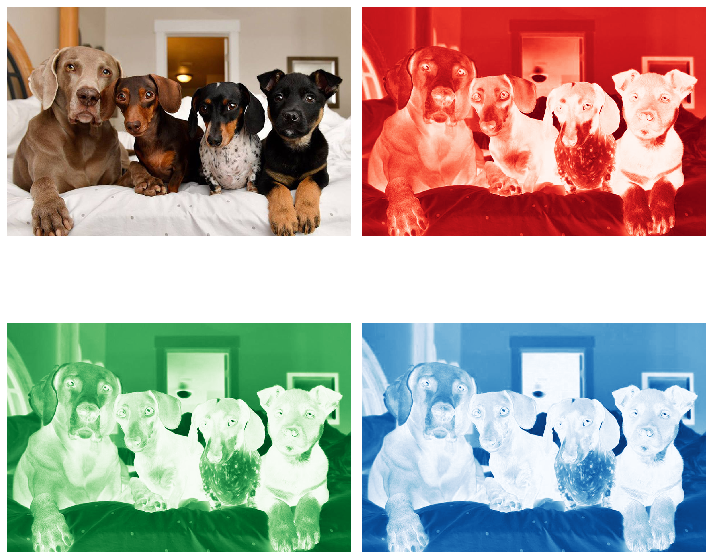

In [117]:
fig, axes = plt.subplots(figsize = (10, 10), ncols=2, nrows=2)
axeIter = iter(axes.flatten())
colours = ["Reds", "Greens", "Blues"]
ax = next(axeIter)
ax.imshow(imageArr)
ax.axis('off')

for i in range(3):
    ax = next(axeIter)
    ax.imshow(imageArr[:,:,i], cmap=colours[i]) #The order is R G B, so 2 is the Blue
    ax.axis('off')
plt.tight_layout()
plt.show()

In [118]:
image_gray = PIL.ImageOps.invert(dogs_1.convert('L'))
image_grayArr = np.asarray(image_gray)
image_grayArr.shape

(800, 1200)

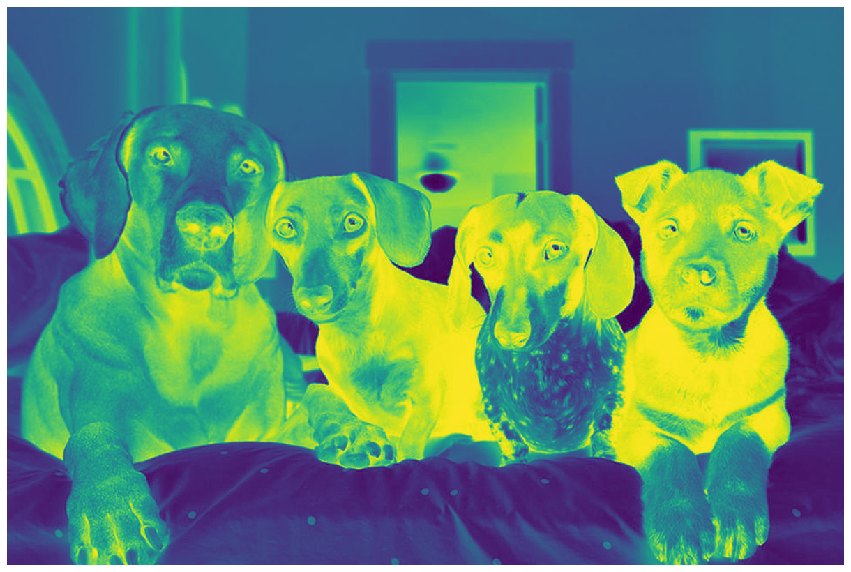

In [119]:
imgRatio = imageArr.shape[0] / imageArr.shape[1]
fig, ax = plt.subplots(figsize = (15, 15))
ax.imshow(image_grayArr) #No third dimension
ax.axis('off')
plt.show()

The first kind of blogs recognize many aspects of the picture, but not exactly the same (for example, eyes of dogs)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/skimage/feature/blob.py:125: RuntimeWarning: invalid value encountered in double_scalars
  r1 = blob1[-1] / blob2[-1]
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/skimage/feature/blob.py:126: RuntimeWarning: divide by zero encountered in true_divide
  pos1 = blob1[:ndim] / (max_sigma * root_ndim)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/skimage/feature/blob.py:127: RuntimeWarning: divide by zero encountered in true_divide
  pos2 = blob2[:ndim] / (max_sigma * root_ndim)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/skimage/feature/blob.py:129: RuntimeWarning: invalid value encountered in subtract
  d = np.sqrt(np.sum((pos2 - pos1)**2))


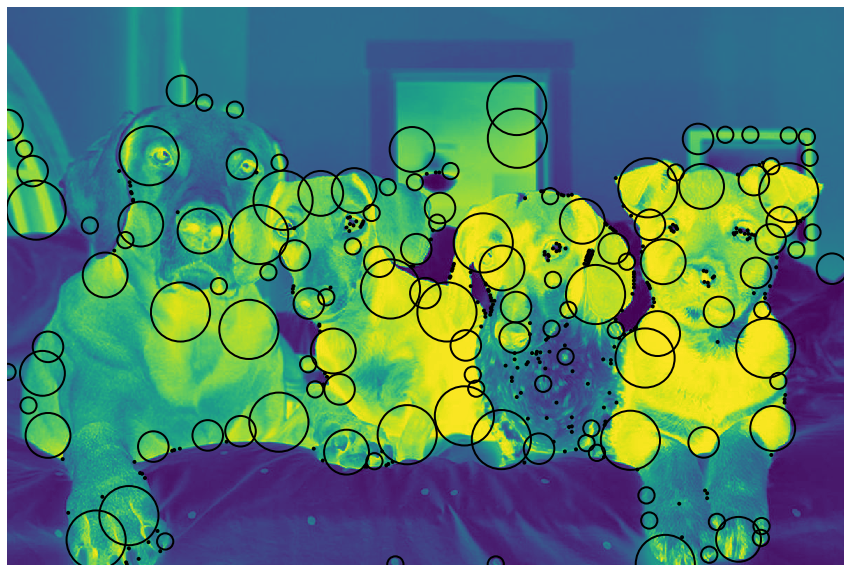

In [120]:
blobs_log = skimage.feature.blob_log(image_grayArr, max_sigma=30, num_sigma=5, threshold=.1)
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2) #Radi
fig, ax = plt.subplots(figsize = (15, 15))
ax.axis('off')

plt.imshow(image_grayArr, interpolation='nearest')
for blob in blobs_log:
    y, x, r = blob
    c = plt.Circle((x, y), r, linewidth=2, fill=False)
    ax.add_patch(c)

This blob is better at recognizing other elements of the picture

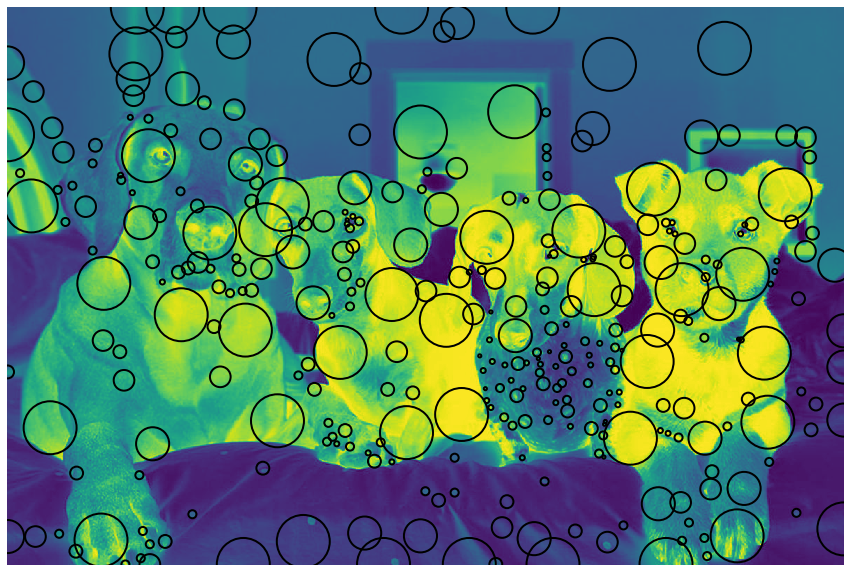

In [121]:
blobs_dog = skimage.feature.blob_dog(image_grayArr, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)
fig, ax = plt.subplots(figsize = (15, 15))
ax.axis('off')

plt.imshow(image_grayArr, interpolation='nearest')
for blob in blobs_dog:
    y, x, r = blob
    c = plt.Circle((x, y), r, linewidth=2, fill=False)
    ax.add_patch(c)

The next one is good at recognizing the faces of the dogs

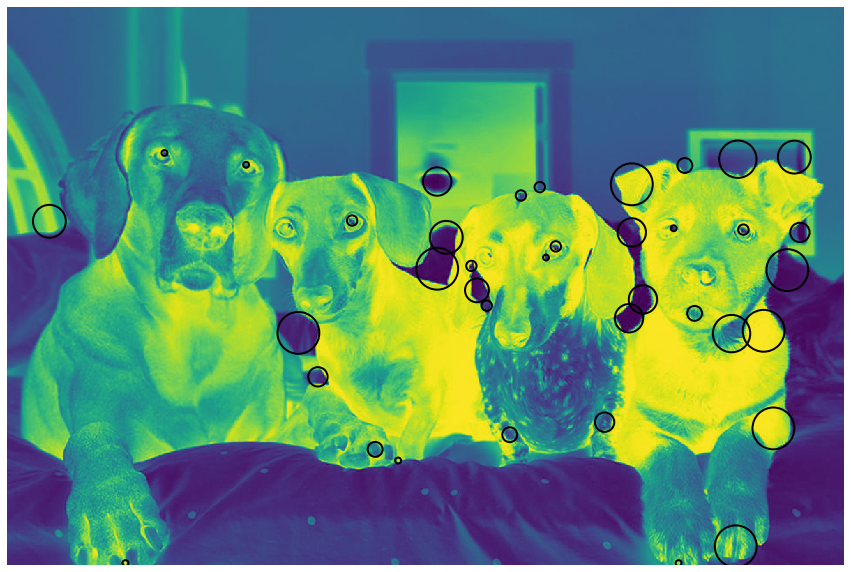

In [122]:
blobs_doh = skimage.feature.blob_doh(image_grayArr, max_sigma=30, threshold=.01)
fig, ax = plt.subplots(figsize = (15, 15))
ax.axis('off')

plt.imshow(image_grayArr, interpolation='nearest')
for blob in blobs_doh:
    y, x, r = blob
    c = plt.Circle((x, y), r, linewidth=2, fill=False)
    ax.add_patch(c)

The rag method didn't work out :(

In [51]:
# labels = skimage.segmentation.slic(dogs_1_grayArr, compactness=30, n_segments=400)
# g = skimage.future.graph.rag_mean_color(dogs_1_grayArr, labels)
# fig, ax = plt.subplots(figsize = (15, 15))
# ax.axis('off')
# lc = skimage.future.graph.show_rag(labels, g, dogs_1_grayArr, ax = ax)

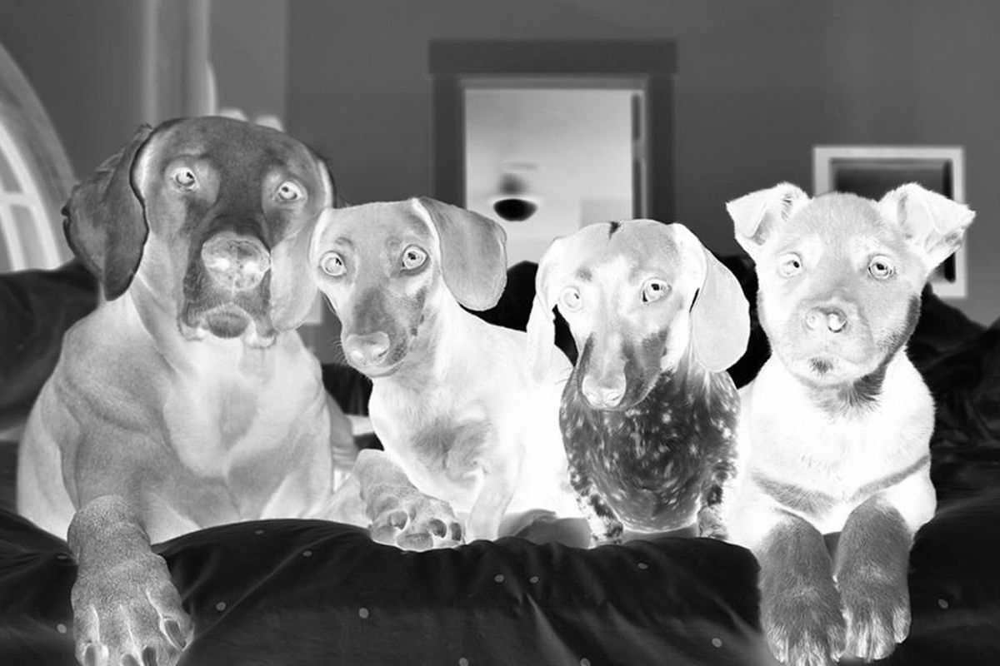

In [144]:
dogs_1_grayArr

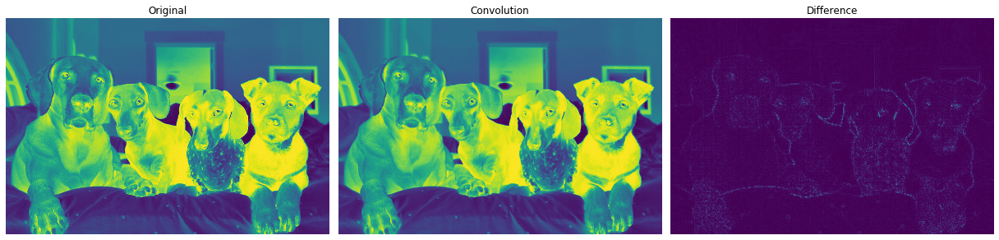

In [126]:
smoothingKernel = np.array([
    [1, 1, 1],
    [1, 2, 1],
    [1, 1, 1]])
c = displayConvolution(image_gray, smoothingKernel)

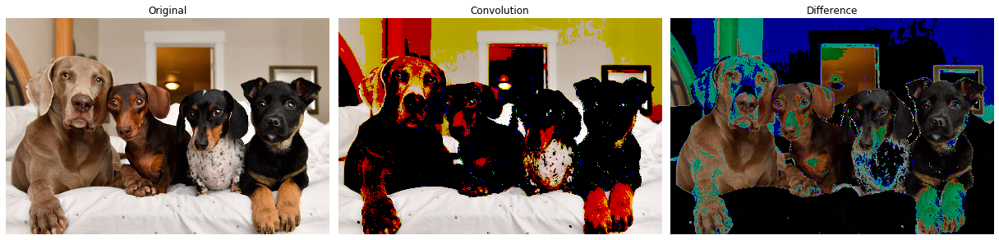

In [128]:
verticalLineKernel = np.array([
    [1, 0, -1],
    [0, 8, 0],
    [1, 0, -1]])
displayConvolution(dogs_1, verticalLineKernel, threshold=.6)

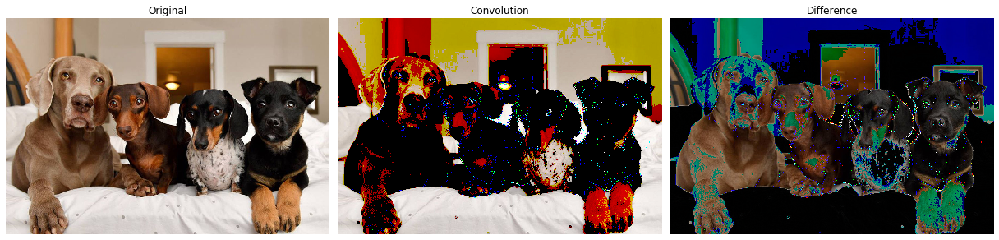

In [130]:
diagonalLineKernel = np.array([
    [-1, 0, -1],
    [0, 8, 0],
    [1, 0, -1]])
displayConvolution(dogs_1, diagonalLineKernel, threshold=.6)

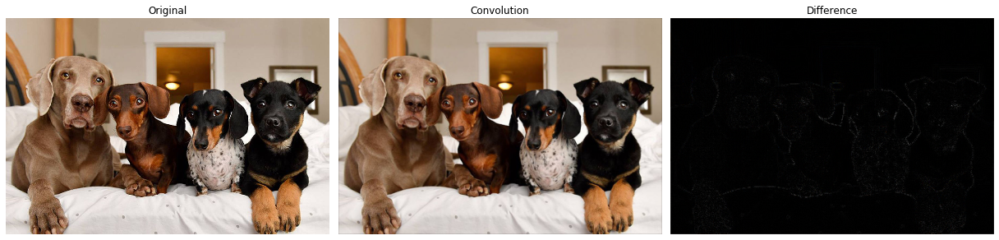

In [132]:
blurKernel = np.array([
    [1, 2, 4, 2, 1],
    [2, 4, 8, 4, 2],
    [4, 8, 16, 8, 4],
    [2, 4, 8, 4, 2],
    [1, 2, 4, 2, 1]])
displayConvolution(dogs_1, blurKernel)

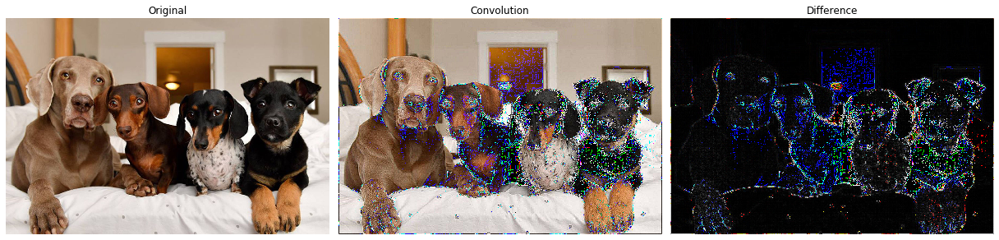

In [134]:
SharpenKernel = np.array([
    [ 0,  0,  -1,  0,  0],
    [ 0, -1,  -2, -1,  0],
    [-1, -2,  20, -2, -1],
    [ 0, -1,  -2, -1,  0],
    [ 0,  0,  -1,  0,  0]])
displayConvolution(dogs_1, SharpenKernel)

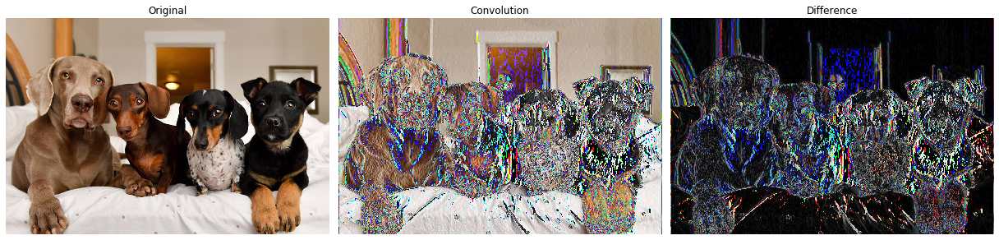

In [136]:
differentKernel = np.array([
    [ 1, 0,  0, 0,  -1],
    [ 1, 0,  0, 0,  -1],
    [ 1, 0,  1, 0,  -1],
    [ 1, 0,  0, 0,  -1],
    [ 1, 0,  0, 0,  -1]])
#This looks neat
displayConvolution(dogs_1, differentKernel)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">You can either:
    
a) Construct cells immediately below this that report the results from experiments in which you place each of images taken or retrieved for the last exercise through the online demos for [caffe](http://demo.caffe.berkeleyvision.org) and [places](http://places.csail.mit.edu/demo.html). Paste the image and the output for both object detector and scene classifier below, beside one another. Calculate precision and recall for caffe's ability to detect objects of interest across your images. What do you think about Places' scene categories and their assignments to your images? 
    
b) Implement any one deep learning example using PyTorch and images.

Could you use image classification to enhance your research project and, if so, how?

Up next, i use image classification with OpenAI that uses tensorflow and keras to classify images. We see that the algorithm classifies many of the elements of an image correctly!

In [30]:
execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
detections = detector.detectObjectsFromImage(input_image=os.path.join(execution_path , "image.jpg"), output_image_path=os.path.join(execution_path , "imagenew.jpg"))

for eachObject in detections:
    print(eachObject["name"] , " : " , eachObject["percentage_probability"] )

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_1:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_2:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_3:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_4:0' shape=(9, 4) dtype=float32> anchors
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



In [34]:
from imageai.Detection import ObjectDetection
import os

execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
detections = detector.detectObjectsFromImage(input_image=os.path.join(execution_path , "image.jpg"), output_image_path=os.path.join(execution_path , "imagenew.jpg"))

for eachObject in detections:
    print(eachObject["name"] , " : " , eachObject["percentage_probability"] )

tracking <tf.Variable 'Variable_10:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_11:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_12:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_13:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_14:0' shape=(9, 4) dtype=float32> anchors
person  :  50.79715847969055
person  :  76.45024061203003
person  :  52.765750885009766
person  :  64.68920707702637
person  :  69.3193793296814
person  :  62.04313635826111
person  :  52.259039878845215
person  :  90.62436819076538
person  :  55.52907586097717
person  :  57.424020767211914


Here, the first row of people are correctly classified, nevertheless, not the ones in the bottom

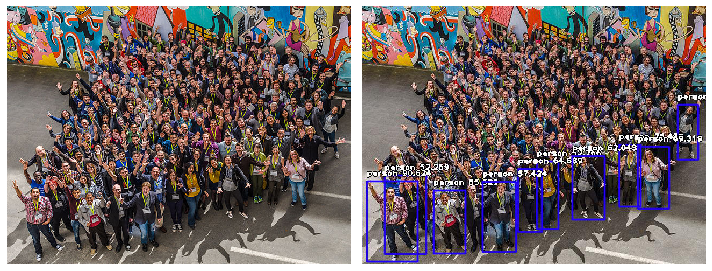

In [39]:
image = PIL.Image.open('image.jpg')
imagenew = PIL.Image.open('imagenew.jpg')

fig, axes = plt.subplots(figsize = (10, 10), ncols=2, nrows=1)
axeIter = iter(axes.flatten())
lst = [image, imagenew]

for i in lst:
    ax = next(axeIter)
    ax.imshow(i) #The order is R G B, so 2 is the Blue
    ax.axis('off')
plt.tight_layout()
plt.show()

In [40]:
from imageai.Detection import ObjectDetection
import os

execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
detections = detector.detectObjectsFromImage(input_image=os.path.join(execution_path , "dogs_1.jpg"), output_image_path=os.path.join(execution_path , "imagenew.jpg"))

for eachObject in detections:
    print(eachObject["name"] , " : " , eachObject["percentage_probability"] )

tracking <tf.Variable 'Variable_15:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_16:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_17:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_18:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_19:0' shape=(9, 4) dtype=float32> anchors
chair  :  56.60088062286377
dog  :  84.62417721748352
dog  :  96.23807668685913
dog  :  96.81938886642456
dog  :  91.4554238319397
bed  :  51.45139694213867


All of the dogs are detected! 

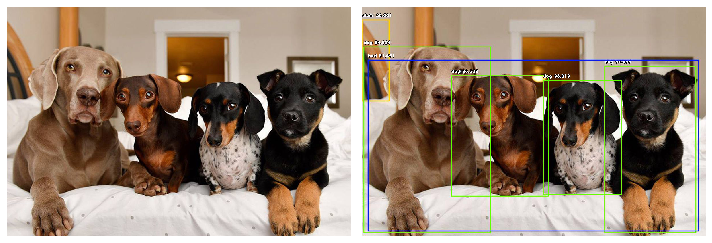

In [43]:
dogs_1 = PIL.Image.open('dogs_1.jpg')
dogsnew = PIL.Image.open('imagenew.jpg')

fig, axes = plt.subplots(figsize = (10, 10), ncols=2, nrows=1)
axeIter = iter(axes.flatten())
lst = [dogs_1, dogsnew]

for i in lst:
    ax = next(axeIter)
    ax.imshow(i) #The order is R G B, so 2 is the Blue
    ax.axis('off')
plt.tight_layout()
plt.show()

In [44]:
from imageai.Detection import ObjectDetection
import os

execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
detections = detector.detectObjectsFromImage(input_image=os.path.join(execution_path , "dogs_3.jpg"), output_image_path=os.path.join(execution_path , "imagenew.jpg"))

for eachObject in detections:
    print(eachObject["name"] , " : " , eachObject["percentage_probability"] )

tracking <tf.Variable 'Variable_20:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_21:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_22:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_23:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_24:0' shape=(9, 4) dtype=float32> anchors
dog  :  62.76895999908447
dog  :  67.1582579612732
dog  :  88.99469375610352
dog  :  86.9147539138794
dog  :  63.08903694152832
teddy bear  :  69.17513608932495
person  :  62.032562494277954
person  :  62.617307901382446
dog  :  50.0943660736084
dog  :  92.80021786689758
dog  :  97.4638819694519


Here, most of the dogs and 2 out of the 3 persons are detected. A funny things is that one of the puppies is classified as a teddy bear (so cute!)

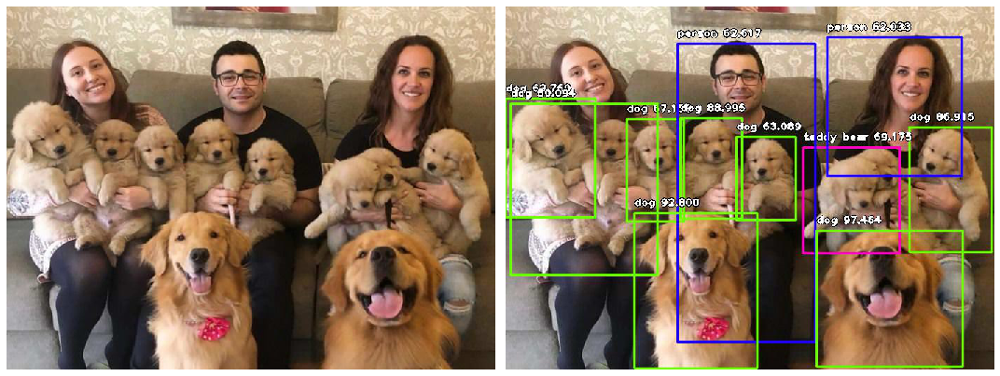

In [45]:
dogs_1 = PIL.Image.open('dogs_3.jpg')
dogsnew = PIL.Image.open('imagenew.jpg')

fig, axes = plt.subplots(figsize = (15, 15), ncols=2, nrows=1)
axeIter = iter(axes.flatten())
lst = [dogs_1, dogsnew]

for i in lst:
    ax = next(axeIter)
    ax.imshow(i) #The order is R G B, so 2 is the Blue
    ax.axis('off')
plt.tight_layout()
plt.show()

In [47]:
from imageai.Detection import ObjectDetection
import os

execution_path = os.getcwd()

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath( os.path.join(execution_path , "resnet50_coco_best_v2.0.1.h5"))
detector.loadModel()
detections = detector.detectObjectsFromImage(input_image=os.path.join(execution_path , "dogs_2.jpeg"), output_image_path=os.path.join(execution_path , "imagenew.jpg"))

for eachObject in detections:
    print(eachObject["name"] , " : " , eachObject["percentage_probability"] )

tracking <tf.Variable 'Variable_30:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_31:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_32:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_33:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_34:0' shape=(9, 4) dtype=float32> anchors
handbag  :  63.090580701828
person  :  86.88433170318604
person  :  97.36676216125488
person  :  75.28698444366455
person  :  91.12813472747803
person  :  97.1872627735138
dog  :  71.5494155883789
dog  :  99.16162490844727
dog  :  52.49958038330078
dog  :  93.18603873252869
person  :  96.04398012161255
person  :  94.24366354942322


Here, the algorithm classifies the persons and the dogs, even a handbag is also detected

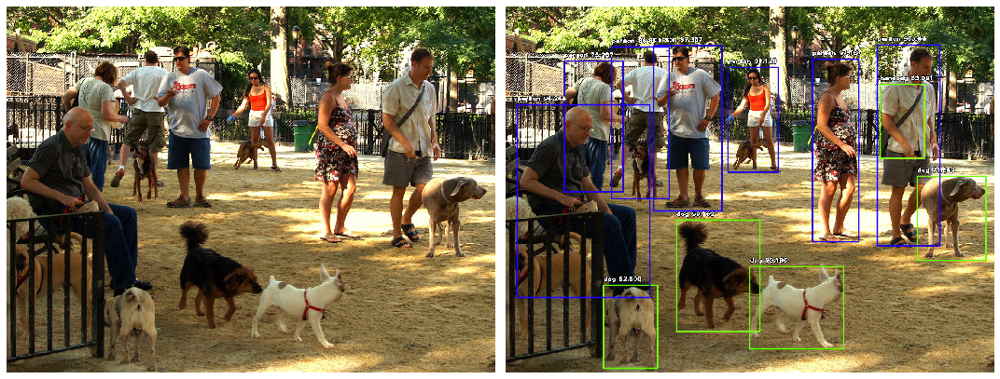

In [48]:
dogs_1 = PIL.Image.open('dogs_2.jpeg')
dogsnew = PIL.Image.open('imagenew.jpg')

fig, axes = plt.subplots(figsize = (15, 15), ncols=2, nrows=1)
axeIter = iter(axes.flatten())
lst = [dogs_1, dogsnew]

for i in lst:
    ax = next(axeIter)
    ax.imshow(i) #The order is R G B, so 2 is the Blue
    ax.axis('off')
plt.tight_layout()
plt.show()